In [121]:
import sweetviz
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
from pandas_profiling import ProfileReport

In [122]:
data=pd.read_csv("Concatenate_B2C_B2E.csv",low_memory=True)

C:\Users\hp\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.



In [3]:
data.head(5)

,InvoiceDate,NetFare,ProductType,ItineraryType
0,01-12-2018 11:43,2160,Other Product,Domestic
1,01-12-2018 11:43,0.49,Other Product,Domestic
2,01-12-2018 13:01,6550,Air,Domestic
3,01-12-2018 13:10,6550,Air,Domestic
4,30-11-2018 14:30,5497,Air,Domestic


In [9]:
data.shape

(278466, 4)

In [10]:
data.columns

Index(['InvoiceDate', 'NetFare', 'ProductType', 'ItineraryType'], dtype='object')

In [13]:
#we have total 14 classes in productType.
data.ProductType.unique() 

array(['Other Product', 'Air', 'Charge', 'Hotel', 'Air Cancellation',
       'Other Product Cancellation', 'payment', 'Hotel Cancellation',
       'refund', nan, 'Air Debit Note', 'Hotel Debit Note', 'Air Loss',
       'Other Product Debit Note', 'Hotel Loss'], dtype=object)

In [15]:
#2types of classes in ItineraryType.
data.ItineraryType.unique()

array(['Domestic', nan, 'International'], dtype=object)

In [14]:
data.dtypes

InvoiceDate      object
NetFare          object
ProductType      object
ItineraryType    object
dtype: object

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278466 entries, 0 to 278465
Data columns (total 4 columns):
InvoiceDate      278464 non-null object
NetFare          217576 non-null object
ProductType      278464 non-null object
ItineraryType    245689 non-null object
dtypes: object(4)
memory usage: 8.5+ MB


In [1]:
data.describe().transpose()

NameError: name 'data' is not defined

In [21]:
#Checking NetFare column,To ensure NetFare has single DataType or Not
def is_unique(s):
    a = s.to_numpy() 
    return (a[0] == a[1:]).all()
is_unique(data['NetFare'])
#It returs False.

False

In [4]:
#single InvoiceDate record entered inside NetFare column may be because of human error.
#Finding which row it's belong to.
data.loc[data['NetFare']=='06-06-2019 17:08']

,InvoiceDate,NetFare,ProductType,ItineraryType
180143,NaN,06-06-2019 17:08,NaN,NaN


In [129]:
#Dropping row 180143.
data=data.drop(180143)

In [6]:
#Converting datatype of "NetFare" to float.
convert_dict = {'NetFare': float} 
  
data = data.astype(convert_dict)

In [7]:
#Converting datatype of "InvoiceDate" to DateTime.
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

In [8]:
#Converting object into categorical
data['ItineraryType'] = pd.Categorical(data.ItineraryType)

In [9]:
#Converting object into categorical
data['ProductType'] = pd.Categorical(data.ProductType)

In [10]:
data.dtypes

InvoiceDate      datetime64[ns]
NetFare                 float64
ProductType            category
ItineraryType          category
dtype: object

In [53]:
#"NetFare" column contains both positive negative zero values as well.
#Less than zero
data[data['NetFare']<0]['NetFare'].count()

12371

In [54]:
#Above zero
data[data['NetFare']>0]['NetFare'].count()

170712

In [56]:
#Equal to Zero
data[data['NetFare']==0]['NetFare'].count()

34492

In [92]:
#We can observe here data is not centralized around the mean.
#we still not yet separated "Domestic and International flights fare"
data['NetFare'].describe()

count    217575.000000
mean       4266.724328
std        9802.796727
min     -497324.000000
25%          10.000000
50%        3501.000000
75%        5944.000000
max      497678.000000
Name: NetFare, dtype: float64

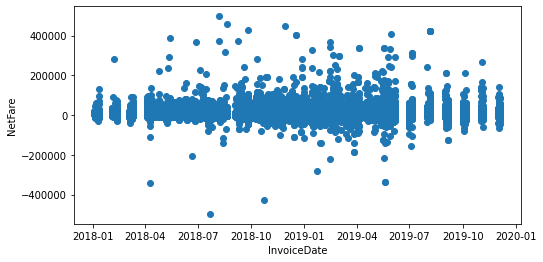

In [91]:
#Lets Visualize our conclusion.
#By using scatter plot
#we can able to observe both positve and negative values here.
fig, ax = plt.subplots(figsize=(8,4))
ax.scatter(data['InvoiceDate'], data['NetFare'])
ax.set_xlabel('InvoiceDate')
ax.set_ylabel('NetFare')
plt.show()
#by this plot i conclude that data is not centralized around the mean.

 But as per the domain knowledge what i found is "NetFare"(also called as consolidator fare)cannot be negative,& cannot be zero
 why because NetFare is the price remained after giving out Commisions or Charges(Nothing but Taxes).
 So in the Next Upcoming steps i will remove both Zero as well as Negative reocrds from the "NetFare" column.

In [57]:
#finding NA
data.isna().sum()

InvoiceDate          1
NetFare          60890
ProductType          1
ItineraryType    32776
dtype: int64

In [58]:
#Lets findout % of "NA" contributed by each column.
for x in data.columns:
    print("Total % Null value in "+x+" - ",data[x].isna().sum()/len(data)*100)
    print()
#Most of the NA values are from "NetFare" and from "ItineraryType"

Total % Null value in InvoiceDate -  0.0003591115580054944

Total % Null value in NetFare -  21.866302766954554

Total % Null value in ProductType -  0.0003591115580054944

Total % Null value in ItineraryType -  11.770240425188085



In [11]:
#Lets Separate Time from Date column. and make a new column as "InvoiceTime"
data['InvoiceTime'] = data['InvoiceDate'].dt.time

In [12]:
#Store only dates in InvoiceDate column
data['InvoiceDate'] = data['InvoiceDate'].dt.date

In [13]:
#Arrange the columns
data=data[['InvoiceDate','InvoiceTime','NetFare','ProductType','ItineraryType']]

In [14]:
data.head(3)

,InvoiceDate,InvoiceTime,NetFare,ProductType,ItineraryType
0,2018-01-12,11:43:00,2160.00,Other Product,Domestic
1,2018-01-12,11:43:00,0.49,Other Product,Domestic
2,2018-01-12,13:01:00,6550.00,Air,Domestic


In [15]:
#Lets create weekday extra column for our better understanding of the data
data['weekday_name'] = pd.DatetimeIndex(data['InvoiceDate']).weekday_name

In [16]:
data.head(3)

,InvoiceDate,InvoiceTime,NetFare,ProductType,ItineraryType,weekday_name
0,2018-01-12,11:43:00,2160.00,Other Product,Domestic,Friday
1,2018-01-12,11:43:00,0.49,Other Product,Domestic,Friday
2,2018-01-12,13:01:00,6550.00,Air,Domestic,Friday


In [17]:
#convert newly created column datatype
data['weekday_name'] = pd.Categorical(data.weekday_name)

In [18]:
#Converting datatype of "InvoiceDate" to DateTime.
data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

In [19]:
data.dtypes

InvoiceDate      datetime64[ns]
InvoiceTime              object
NetFare                 float64
ProductType            category
ItineraryType          category
weekday_name           category
dtype: object

In [81]:
#In "InvoiceDate" we have two years of records 2018 and 2019.
#Lets count number of records in 2018
Rec_of_2018=(data['InvoiceDate'][data['InvoiceDate'].dt.year <2019]).count() 
print(Rec_of_2018)

68786


In [87]:
#Lets calculate the % of records 2018 has.
print("percentage of records in year 2018 is :",Rec_of_2018/len(data)*100)

percentage of records in year 2018 is : 24.70184762896594


In [88]:
#Lets count number of records in 2019
Rec_of_2019=(data['InvoiceDate'][data['InvoiceDate'].dt.year >2018]).count() 
print(Rec_of_2019)

209678


In [89]:
#Lets calculate the % of records 2019 has.
print("percentage of records in year 2019 is :",Rec_of_2019/len(data)*100)

percentage of records in year 2019 is : 75.29779325947605


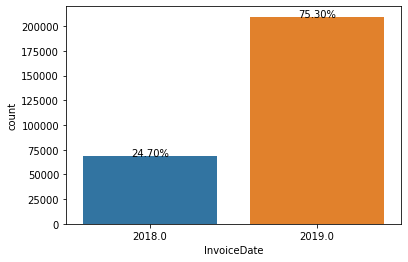

In [90]:
#Lets visualize our conclusion.

dat1 = data['InvoiceDate'].dt.year
ax = sns.countplot(dat1)

total = len(dat1)
for x in ax.patches:
  height= x.get_height()

  ax.text(x.get_x()+x.get_width()/2,
          height,
          '{:.2f}%'.format(height/total*100),
          ha='center')

As we observed year 2018 has less records compared to the year 2019.

In [125]:
#Lets Try with AutoEDA by pandas profile #to run LINE 129 is vimp.
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)

In [126]:
profile.to_widgets()

In [127]:
#Save output result in HTML
profile.to_file("Output2.html")

In [132]:
#For backup.
data1=data

In [133]:
#canverting NetFare to Numeric.
data1['NetFare'] = pd.to_numeric(data1['NetFare'], errors='coerce')

In [134]:
#Auto EDA by SweetViz. #to run LINE 129 is vimp.
my_report = sweetviz.analyze([data1, "Data1"],target_feat='NetFare')




                                   |                         | [  0%]   00:00  -> (? left)


Summarizing dataframe:             |                         | [  0%]   00:00  -> (? left)


Summarizing dataframe:             |████▏                | [ 20%]   00:01  -> (00:06 left)


:TARGET::                          |████▏                | [ 20%]   00:01  -> (00:06 left)


:TARGET::                          |████████▍            | [ 40%]   00:02  -> (00:04 left)


:InvoiceDate:                      |████████▍            | [ 40%]   00:02  -> (00:04 left)


:InvoiceDate:                      |████████████▌        | [ 60%]   00:05  -> (00:03 left)


:ProductType:                      |████████████▌        | [ 60%]   00:05  -> (00:03 left)


:ProductType:                      |████████████████▊    | [ 80%]   00:07  -> (00:01 left)


:ItineraryType:                    |████████████████▊    | [ 80%]   00:07  -> (00:01 left)


:ItineraryType:                    |█████████████████████| [100%]  

Creating Associations graph... DONE!


In [135]:
#Saving the report in HTML
my_report.show_html('Report.html')

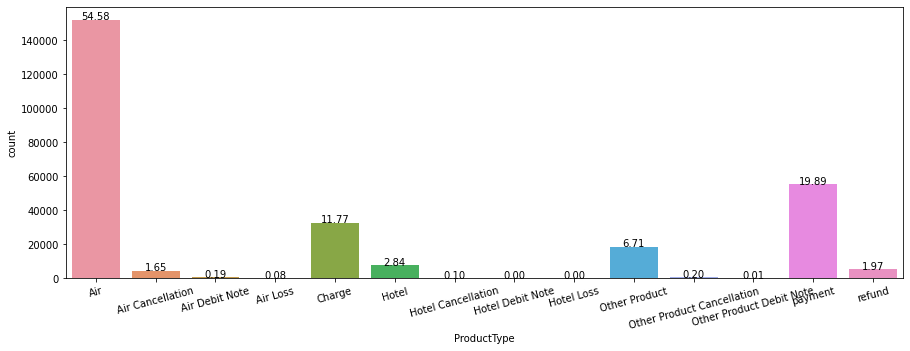

In [137]:
#Lets explore the productType column
#we have total 14 classes in productType as we seen earlier.
#Lets visualize
size=(15,5)
plt.figure(figsize=size)
ax = sns.countplot(data['ProductType'])
for x in ax.patches:
  height = x.get_height()
  ax.text(x.get_x() + x.get_width()/2,
          height+1,
          '{:.2f}'.format(height/len(data.ProductType)*100),
          ha='center')
plt.xticks(rotation=15)
plt.show()


In [117]:
charge_Fare = data[(data['ProductType']=='charge')]
whole_array_contains_zero = not np.any(charge_Fare)
whole_array_contains_zero
#Charge class conatins complete array as zero.

True

In [ ]:
So here we can see "AIR" contibutes 54%. after that payment and charge and other product and aircancellaton.
Inoreder to choose in these 14 different productTypes again our "Domain knowledge" comes in handy.
most of the productType not directly related to "NetFare and InvoiceDate" for egs: Here we can see Refund as productType,
we cant able to consider it in our model building.. we dont know for which flight(flying at exact date and time) the refund is issued,
same goes with the other products.
and based on domain.. the "Refund" for the Netfare is Zero (Refund cannot be issued as we are booking through agent).
and our main aim of our project is finding "AIR-price", for which these products will not affect.
#so i decided to select only "Air" for our model building, as it is providing 54% of the total records


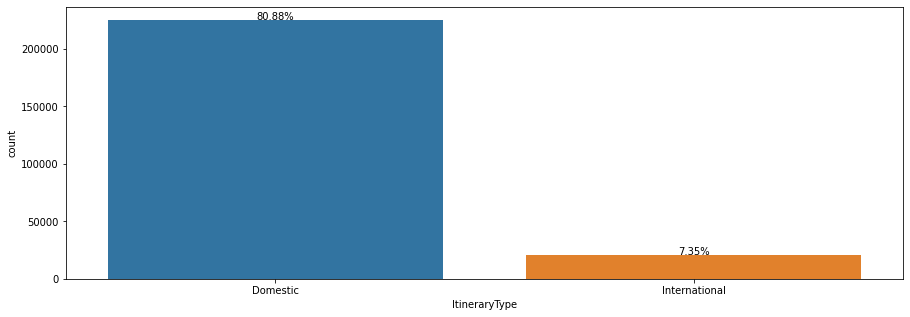

In [141]:
#Lets explore itineraryType
plt.figure(figsize=size)
ax = sns.countplot(data['ItineraryType'])
total = len(data)
for p in ax.patches:
  height = p.get_height()
  ax.text(p.get_x()+p.get_width()/2,
            height,
            '{:.2f}%'.format(height/total*100),
            ha="center") 
plt.show()

In [ ]:
Domestic has 80.88% of records and International has 7.35% of records. There is 11% of Null values in ItineraryType,
That is the reason we are seeing 12% of count missing in this plot. we not yet filled those values.

In [ ]:
#Lets findout is there any more insight we will get 
#Before removing all the productTypes except air
#And separating the data as Domestic and International
#Filling missing values
#and removing outliers.

In [ ]:
#Visualization

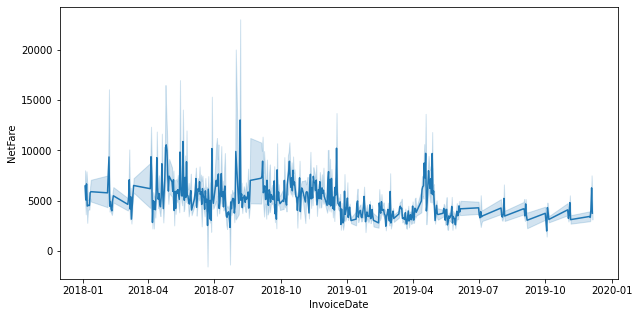

In [133]:
plt.figure(figsize=size)
sns.lineplot(x='InvoiceDate',y='NetFare',data=data)
plt.show()

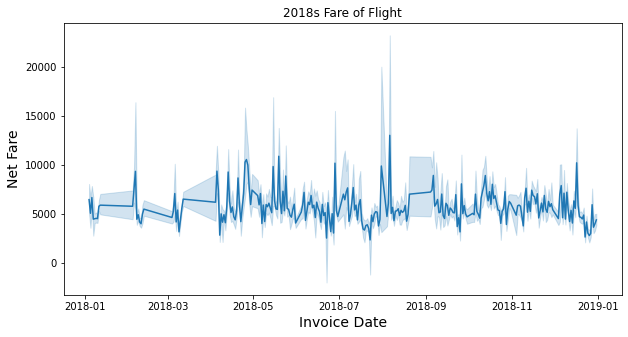

In [132]:
#for 2018
plt.figure(figsize=size)
sns.lineplot(x=data[data['InvoiceDate'].dt.year < 2019]['InvoiceDate'],y='NetFare',data=data)
plt.xlabel('Invoice Date',fontsize=14,color='black')
plt.ylabel('Net Fare',fontsize=14,color='black')
plt.title('2018s Fare of Flight',fontsize=12,color='black')
plt.show()
#we can see increase in ticket purchasing in the month of 8th and low in 1st month

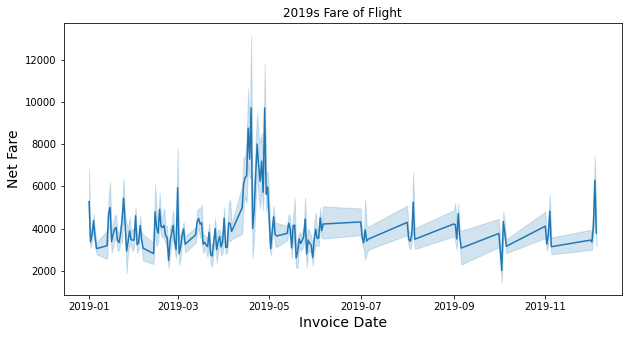

In [131]:
# for 2019.
size=(10,5)
plt.figure(figsize=size)
sns.lineplot(x=data[data['InvoiceDate'].dt.year > 2018]['InvoiceDate'],y='NetFare',data=data)
plt.xlabel('Invoice Date',fontsize=14,color='black')
plt.ylabel('Net Fare',fontsize=14,color='black')
plt.title('2019s Fare of Flight',fontsize=12,color='black')
plt.show()
#Increase in ticket purchase in the month of 4 and 5, low in 1 to 3 month

In [20]:
sort_data=data.sort_values("InvoiceTime", axis = 0, ascending = True) 
fig = px.line(sort_data, x='InvoiceTime', y='NetFare',title="Invoice Time vs NetFare",width=800, height=400)
fig.show()

As we can see in above plot the price of the ticket low in the early morning from 2AM to 7Am. 
after that, It increases as the time of the day Increases. 

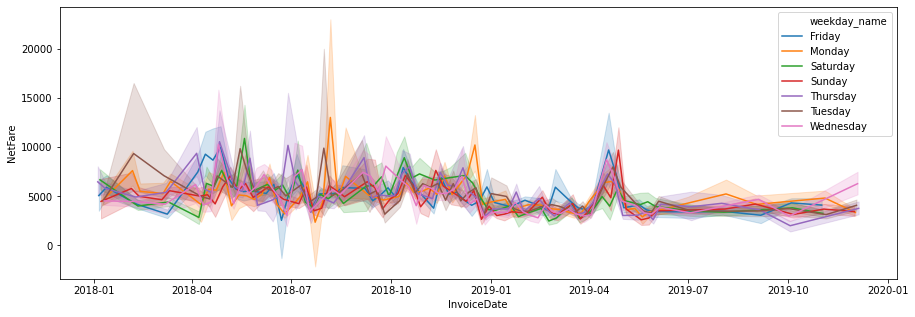

In [142]:
#checking on daywise
plt.figure(figsize=size)
sns.lineplot(x='InvoiceDate',y='NetFare',data=data,hue='weekday_name')
plt.show()

above plot proves our domain knowledge. i.e.
The rates offered by airlines keep varying. "Monday" morning flights to major cities are costly. This is because of the heavy rush of business travellers at the start of the work week. Similarly, 
there is heavy outbound rush from cities on "Friday" evenings and this pushes up the rates. 
Leisure travellers can avoid this rush and save money.
Book tickets on "Tuesdays and Thursdays" as they are usually cheaper on these two days of the week.

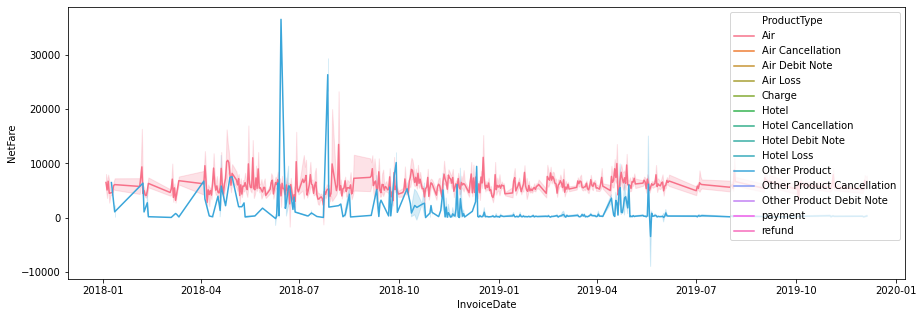

In [146]:
#plotting entire productType, To contribution of every individual classes.
plt.figure(figsize=size)
sns.lineplot(x='InvoiceDate',y='NetFare',data=d,hue='ProductType')
plt.show()

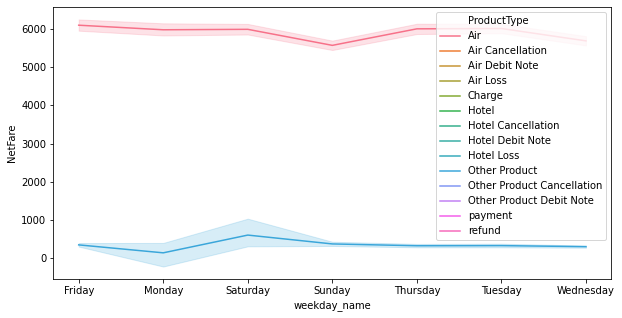

In [23]:
#checking more relations
size=(10,5)
d = data[(data['ProductType']=='Other Product')|(data['ProductType']=='Air')|(data['ProductType']=='payment')]
plt.figure(figsize=size)
sns.lineplot(x='weekday_name',y='NetFare',data=d,hue='ProductType')
plt.show()

In [26]:
d['ProductType'].describe()

count     226081
unique         3
top          Air
freq      151995
Name: ProductType, dtype: object

In [27]:
d['NetFare'].describe()

count    170687.000000
mean       5315.959081
std       10430.381498
min     -497324.000000
25%        2373.000000
50%        4225.000000
75%        6519.000000
max      497678.000000
Name: NetFare, dtype: float64

In [28]:
# without other product variable
other = d[d['ProductType']!='Other Product']['NetFare']
other.describe()

count    151995.000000
mean       5928.915116
std       10750.571601
min     -497324.000000
25%        3030.000000
50%        4629.000000
75%        6849.000000
max      497678.000000
Name: NetFare, dtype: float64

In [29]:
# without other Product and payment
other = d[d['ProductType']=='Air']['NetFare']
other.describe()

count    151995.000000
mean       5928.915116
std       10750.571601
min     -497324.000000
25%        3030.000000
50%        4629.000000
75%        6849.000000
max      497678.000000
Name: NetFare, dtype: float64

In [ ]:
#Selecting only "AIR" class in ProductType.
data2 = pd.DataFrame()
data2 = data[data['ProductType']=='Air']

In [40]:
data2.shape #Only AIR

(151995, 6)

C:\Users\hp\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



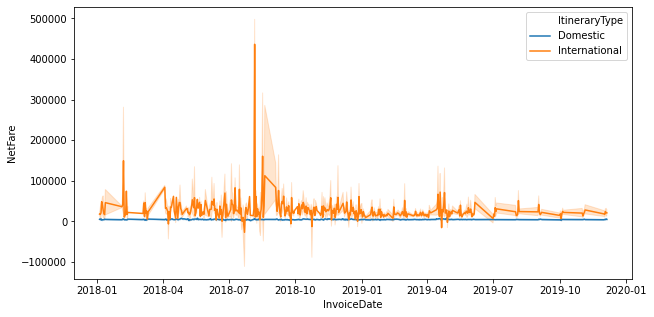

In [32]:
#Plotting ItineraryType by selecting "AIR" in productType.
plt.figure(figsize=size)
sns.lineplot(x='InvoiceDate',y='NetFare',data=data2,hue='ItineraryType')
plt.show()
#As international Fare varies a  lot compared to domestic, So we can see domination of International Air Fare in this graph.

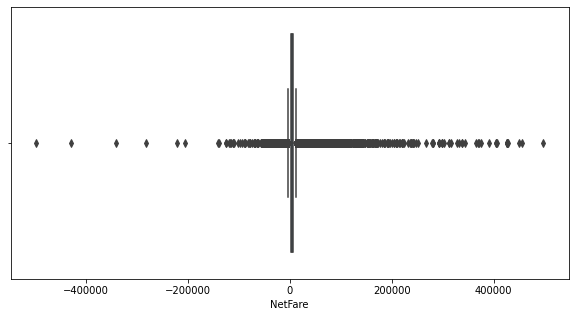

In [33]:
#Checking for outliers by selectin "AIR" in productTYpe.
#In fallowing boxplots im just giving random threshold fare and observing the outliers.
plt.figure(figsize=size)
sns.boxplot(data2['NetFare'])
plt.show()

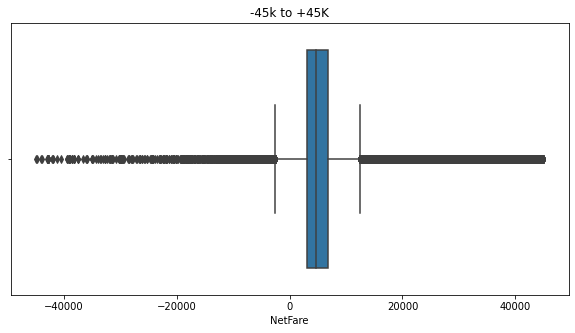

In [34]:
without_outliers = data2[(data2['NetFare']<45000) & (data2['NetFare']>(-45000))]['NetFare']
plt.figure(figsize=size)
sns.boxplot(without_outliers)
plt.title('-45k to +45K')
plt.show()

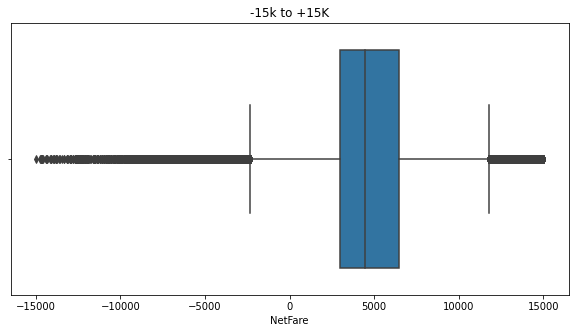

In [35]:
without_outliers = data2[(data2['NetFare']<15000) & (data2['NetFare']>(-15000))]['NetFare']
plt.figure(figsize=size)
sns.boxplot(without_outliers)
plt.title('-15k to +15K')
plt.show()

In [36]:
#Number of counts above mentioned fare
data2[data2['NetFare']>45000]['NetFare'].count()

1244

In [37]:
data2[data2['NetFare']>100000]['NetFare'].count()

246

In [38]:
data2[data2['NetFare']<-100000]['NetFare'].count()

17

In [39]:
data2[data2['NetFare']<-45000]['NetFare'].count()

69

In [46]:
#only "AIR" and "Domestic"
data2[data2['ItineraryType']=='Domestic']['NetFare'].describe()
#Observe std and mean, its like almost near to mean.

count    141234.000000
mean       4749.053160
std        3606.290473
min      -56364.000000
25%        2973.000000
50%        4465.000000
75%        6454.000000
max       64131.000000
Name: NetFare, dtype: float64

In [47]:
#only "AiR" and "International"
data2[data2['ItineraryType']=='International']['NetFare'].describe()
#Observe mean and std, NetFare varies high in the range.

count     10761.000000
mean      21414.151023
std       34695.806401
min     -497324.000000
25%        6562.742300
50%       14378.000000
75%       26600.000000
max      497678.000000
Name: NetFare, dtype: float64

In [54]:
#Sorting the data
data.sort_values(by='InvoiceDate',inplace=True)

In [55]:
data

,InvoiceDate,InvoiceTime,NetFare,ProductType,ItineraryType,weekday_name
186886,2018-01-04,08:26:00,8222.0,Air,Domestic,Thursday
186894,2018-01-04,13:25:00,5168.0,Air,Domestic,Thursday
186900,2018-01-04,13:51:00,3568.0,Air,Domestic,Thursday
186899,2018-01-04,13:41:00,5705.0,Air,Domestic,Thursday
186898,2018-01-04,13:32:00,6893.0,Air,Domestic,Thursday
...,...,...,...,...,...,...
140173,2019-12-05,11:13:00,NaN,payment,Domestic,Thursday
140172,2019-12-05,11:13:00,0.0,Charge,NaN,Thursday
140140,2019-12-05,10:25:00,260.0,Other Product,Domestic,Thursday
140616,2019-12-05,18:49:00,5454.0,Air,Domestic,Thursday


In [63]:
#Based on Domain Knowledge and preprocessin I selected "Air" only.
data = data[data['ProductType']=='Air']

In [56]:
data.dtypes

InvoiceDate      datetime64[ns]
InvoiceTime              object
NetFare                 float64
ProductType            category
ItineraryType          category
weekday_name           category
dtype: object

In [60]:
#Converting InvoiceTime object into timedelta format.
data['InvoiceTime'] = pd.to_timedelta(data['InvoiceTime'].astype(str))

In [61]:
data.dtypes

InvoiceDate       datetime64[ns]
InvoiceTime      timedelta64[ns]
NetFare                  float64
ProductType             category
ItineraryType           category
weekday_name            category
dtype: object

In [64]:
len(data)

151995

In [67]:
data.describe()

,InvoiceTime,NetFare
count,151995,151995.000000
mean,0 days 15:20:06.461265,5928.915116
std,0 days 04:02:05.771816,10750.571601
min,0 days 00:00:00,-497324.000000
25%,0 days 12:36:00,3030.000000
50%,0 days 15:27:00,4629.000000
75%,0 days 18:04:00,6849.000000
max,0 days 23:59:00,497678.000000


In [68]:
data.head(10)

,InvoiceDate,InvoiceTime,NetFare,ProductType,ItineraryType,weekday_name
186886,2018-01-04,08:26:00,8222.0,Air,Domestic,Thursday
186894,2018-01-04,13:25:00,5168.0,Air,Domestic,Thursday
186900,2018-01-04,13:51:00,3568.0,Air,Domestic,Thursday
186899,2018-01-04,13:41:00,5705.0,Air,Domestic,Thursday
186898,2018-01-04,13:32:00,6893.0,Air,Domestic,Thursday
186897,2018-01-04,13:32:00,8894.0,Air,Domestic,Thursday
186895,2018-01-04,13:32:00,8894.0,Air,Domestic,Thursday
186891,2018-01-04,12:37:00,4983.0,Air,Domestic,Thursday
186893,2018-01-04,13:25:00,5168.0,Air,Domestic,Thursday
186892,2018-01-04,13:25:00,5168.0,Air,Domestic,Thursday


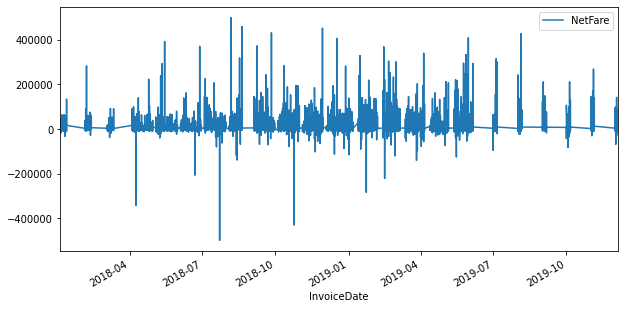

In [69]:
data.plot(x='InvoiceDate',y='NetFare',figsize=(10,5))

As from our Previous EDA, and from Domain knowledge we will drop the Negative Value from NetFare

In [70]:
#Selecting only positive values.
data = data[data['NetFare']>0]

In [71]:
data

,InvoiceDate,InvoiceTime,NetFare,ProductType,ItineraryType,weekday_name
186886,2018-01-04,08:26:00,8222.0,Air,Domestic,Thursday
186894,2018-01-04,13:25:00,5168.0,Air,Domestic,Thursday
186900,2018-01-04,13:51:00,3568.0,Air,Domestic,Thursday
186899,2018-01-04,13:41:00,5705.0,Air,Domestic,Thursday
186898,2018-01-04,13:32:00,6893.0,Air,Domestic,Thursday
...,...,...,...,...,...,...
140146,2019-12-05,10:30:00,7852.0,Air,Domestic,Thursday
140144,2019-12-05,10:27:00,5797.0,Air,Domestic,Thursday
140138,2019-12-05,10:23:00,8075.0,Air,Domestic,Thursday
140176,2019-12-05,11:15:00,2555.0,Air,Domestic,Thursday


In [72]:
data.isna().sum()

InvoiceDate      0
InvoiceTime      0
NetFare          0
ProductType      0
ItineraryType    0
weekday_name     0
dtype: int64

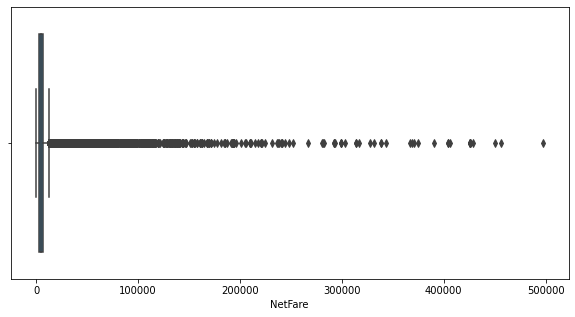

In [73]:
#Checking once again for the outliers.
plt.figure(figsize=size)
sns.boxplot(data['NetFare'])
plt.show()

#As i said in the earlier,we have to split the data, as we need two different model.

1] Domestic

2] International.

In [74]:
#As Domestic
domesticData = data[data['ItineraryType']=='Domestic'][['InvoiceDate','NetFare']]

In [75]:
#As International
internationalData = data[data['ItineraryType']=='International'][['InvoiceDate','NetFare']]

In [76]:
len(domesticData)

134001

In [77]:
len(internationalData)

10261

In [78]:
domesticData.isna().sum()

InvoiceDate    0
NetFare        0
dtype: int64

In [79]:
internationalData.isna().sum()

InvoiceDate    0
NetFare        0
dtype: int64

In [87]:
print("        Domestic","\n",domesticData.describe())
print()
print("        International","\n",internationalData.describe())

        Domestic 
              NetFare
count  134001.000000
mean     5198.692509
std      2999.433388
min         1.000000
25%      3211.000000
50%      4640.000000
75%      6582.000000
max     64131.000000

        International 
              NetFare
count   10261.000000
mean    23626.767777
std     32628.212892
min        19.070000
25%      7416.000000
50%     15190.000000
75%     27665.000000
max    497678.000000


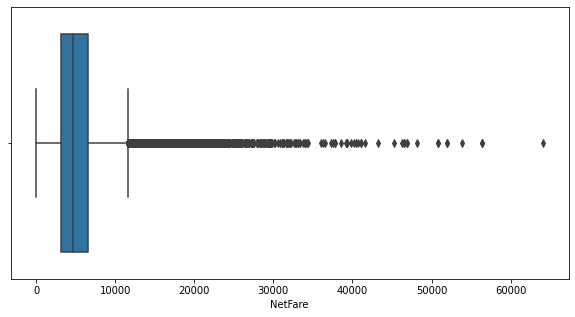

In [88]:
#Boxplot for Domestic
plt.figure(figsize=size)
sns.boxplot(domesticData['NetFare'])
plt.show()
#We can clearly able to see outliers for the Domsetic flight

  Lets Remove Outliers for Domestic flight by using Z_Score method.

In [89]:
z = pd.DataFrame(stats.zscore(domesticData['NetFare']).astype(float),columns=['z'])
d = z.describe()
d.iloc[6]

z    0.461191
Name: 75%, dtype: float64

 We can see that 75% of data under 0.0452,

 So we will remove all the datapoints above that threshold value.

In [91]:
#Removing outliers by,
#Selecting the values below 0.461191
domesticData['zScore'] = z['z'].values
domesticData = domesticData[domesticData['zScore']<=0.461191]

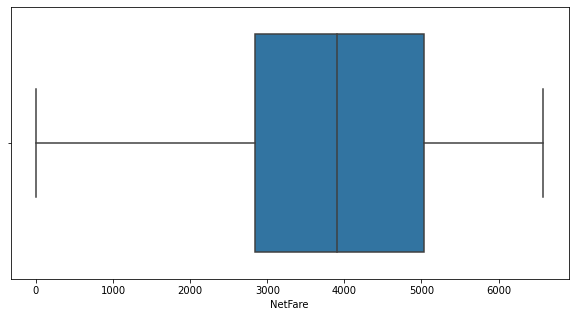

In [92]:
#Without outliers "Domestic Data"
plt.figure(figsize=size)
sns.boxplot(domesticData['NetFare'])
plt.show()

 Now Removing Outliers for Inter-National flight.

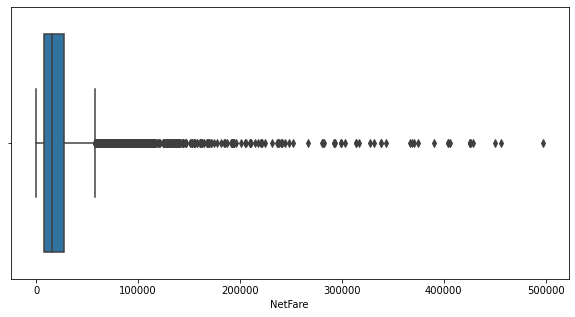

In [94]:
#Plotting boxplot for INternational
plt.figure(figsize=size)
sns.boxplot(internationalData['NetFare'])
plt.show()
#We can able to see outliers here.

In [96]:
z = pd.DataFrame(stats.zscore(internationalData['NetFare']).astype(float),columns=['z'])
d = z.describe()
d.iloc[6]

z    0.123771
Name: 75%, dtype: float64

In [99]:
#Removing outliers by,
#Selecting the values below 0.123771
internationalData['zScore'] = z['z'].values
internationalData = internationalData[internationalData['zScore']<=0.123771]

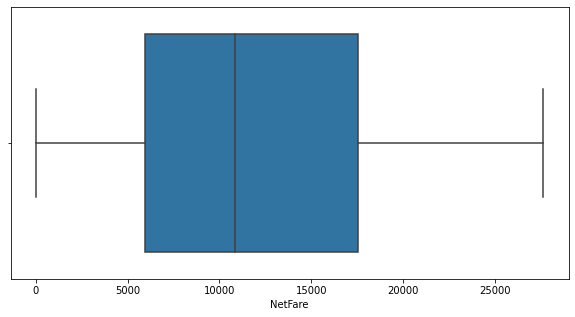

In [100]:
#Without outliers "International Data"
plt.figure(figsize=size)
sns.boxplot(internationalData['NetFare'])
plt.show()

In [ ]:
Now lets Resample the Domestic Dataset and International dataset by Mean and Total.

In [102]:
domesticData.drop('zScore',1,inplace=True)

In [103]:
internationalData.drop('zScore',1,inplace=True)

In [105]:
domesticData.set_index('InvoiceDate',inplace=True)

In [106]:
mean = domesticData.resample('D').mean().ffill()
total = domesticData.resample('D').sum().ffill()
#len(mean) -- > 436
#len(total) -- >436

mean.columns = ['AvgNetFare']
total.columns = ['TotalNetFare']

print(mean.isna().sum())
print(total.isna().sum())

AvgNetFare    0
dtype: int64
TotalNetFare    0
dtype: int64


In resampling method of pandas it fill the missing Dates or month even if there is no such row in original dataset and gives NaN value for the variable

So we use ffill() (forward Fill) method to fill those missing NaN values

In [107]:
finalDomesticData = mean.join(total)
finalDomesticData

,AvgNetFare,TotalNetFare
InvoiceDate,,
2018-01-04,4276.300000,85526.0
2018-01-05,4235.000000,118580.0
2018-01-06,4323.838710,268078.0
2018-01-07,3392.442308,176407.0
2018-01-08,4050.176030,1081397.0
...,...,...
2019-12-01,3637.807407,982208.0
2019-12-02,3801.884826,2079631.0
2019-12-03,3957.569975,1555325.0


International Dataset Resampling with Mean and Total

In [108]:
internationalData.set_index('InvoiceDate',inplace=True)

In [109]:
internationalData.isna().sum()

NetFare    0
dtype: int64

In [111]:
mean = internationalData.resample('D').mean().ffill()
total = internationalData.resample('D').sum().ffill()
#len(mean) -- > 436
#len(total) -- >436

mean.columns = ['AvgNetFare']
total.columns = ['TotalNetFare']

print(mean.isna().sum())
print(total.isna().sum())

AvgNetFare    0
dtype: int64
TotalNetFare    0
dtype: int64


In [112]:
finalInternationalData = mean.join(total)
finalInternationalData

,AvgNetFare,TotalNetFare
InvoiceDate,,
2018-01-04,18090.000000,54270.00
2018-01-05,8323.333333,24970.00
2018-01-06,7441.333333,22324.00
2018-01-07,7441.333333,0.00
2018-01-08,19411.000000,19411.00
...,...,...
2019-12-01,11144.214737,211740.08
2019-12-02,10195.021364,448580.94
2019-12-03,11258.400000,506628.00


Writing preprocessed dataset of "Domestic" and "International" to localdisk.

In [113]:
finalDomesticData.to_csv('C:/Users/hp/Desktop/EDA again/FinalDomesticDataset.csv',index=True)

In [114]:
finalInternationalData.to_csv('C:/Users/hp/Desktop/EDA again/FinalInternatioalDataset.csv',index=True)